# Task 0c - HVG Selection
This notebook does HVG selection of the data. This is the third step and requires the adata from the second step, Task 0b - Normalization.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
# from matplotlib import colors
import seaborn as sb
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) 
sc.settings.verbosity = 3

### IMPORT ADATA OF QC

In [3]:
adata = sc.read_h5ad('../data/adata/rev_norm_adata.h5ad')

### Split adata into the adata of the samples

In [4]:
adata.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors
AAACCCAAGCGTCTGC-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6425,8.768108,33471.0,10.418465,21.947357,30.028980,39.547668,53.033970,0.0,0.0,0.0,10.418435,33471.0,6425,0.901822
AAACCCACAGCAGTTT-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,7388,8.907748,53954.0,10.895905,20.773251,30.629796,40.371428,53.454795,0.0,0.0,0.0,10.895887,53954.0,7388,1.462143
AAACCCACAGGTCAAG-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6240,8.738896,32445.0,10.387333,21.732162,31.502543,40.915395,53.752504,0.0,0.0,0.0,10.387301,32445.0,6240,0.877331
AAACCCACATTCCTAT-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,1079,6.984716,1787.0,7.488853,25.853386,34.750979,46.838276,67.599328,0.0,0.0,0.0,7.488294,1787.0,1079,0.038582
AAACCCATCGAAGGAC-1-0-0-0-0-0-0,1_9591_TEBBO,0,mouse,6506,8.780634,36774.0,10.512573,23.851090,33.700441,43.345842,55.824767,0.0,0.0,0.0,10.512547,36774.0,6506,0.924524
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGCACAGA-1-1,7_star-like,1,mouse,7535,8.927447,64538.0,11.075025,21.889429,31.998203,41.972171,55.313149,0.0,0.0,0.0,11.075009,64538.0,7535,1.682680
TTTGTTGGTACATTGC-1-1,7_star-like,1,mouse,3629,8.196988,8385.0,9.034319,12.784735,18.366130,26.440072,42.742993,0.0,0.0,0.0,9.034200,8385.0,3629,0.392576
TTTGTTGGTAGTATAG-1-1,7_star-like,1,mouse,7480,8.920122,55482.0,10.923832,21.452002,32.394290,42.502073,54.974586,0.0,0.0,0.0,10.923814,55482.0,7480,1.462513
TTTGTTGGTTGTGGCC-1-1,7_star-like,1,mouse,7885,8.972844,63675.0,11.061563,17.502945,25.980369,35.586965,49.804476,0.0,0.0,0.0,11.061547,63675.0,7885,1.841218


In [5]:
adata1 = adata[adata.obs.sample_id=='1_9591_TEBBO']
adata2 = adata[adata.obs.sample_id=='2_9591_cystic_branched']
adata3 = adata[adata.obs.sample_id=='3_thick_branched']
adata4 = adata[adata.obs.sample_id=='4_tree-like']
adata5 = adata[adata.obs.sample_id=='5_branched_mesenchymal']
adata6 = adata[adata.obs.sample_id=='6_firework']
adata7 = adata[adata.obs.sample_id=='7_star-like']

# Highly Variable Genes

In [6]:
adata

AnnData object with n_obs × n_vars = 46967 × 11939
    obs: 'sample_id', 'sample_nr', 'donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'log_counts', 'n_counts', 'n_genes', 'size_factors'
    var: 'feature_types', 'mt', 'gene_symbols-0-0-0-0-0-0', 'n_cells_by_counts-0-0-0-0-0-0', 'mean_counts-0-0-0-0-0-0', 'log1p_mean_counts-0-0-0-0-0-0', 'pct_dropout_by_counts-0-0-0-0-0-0', 'total_counts-0-0-0-0-0-0', 'log1p_total_counts-0-0-0-0-0-0', 'n_cells-0-0-0-0-0-0', 'gene_symbols-1-0-0-0-0-0', 'n_cells_by_counts-1-0-0-0-0-0', 'mean_counts-1-0-0-0-0-0', 'log1p_mean_counts-1-0-0-0-0-0', 'pct_dropout_by_counts-1-0-0-0-0-0', 'total_counts-1-0-0-0-0-0', 'log1p_total_counts-1-0-0-0-0-0', 'n_cells-1-0-0-0-0-0', 'gene_symbols-1-0-0-0-0', 'n_cells_by_counts-1-0-0-0-0', 'mean_co

In [7]:
sc.pp.highly_variable_genes(adata1, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata1.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


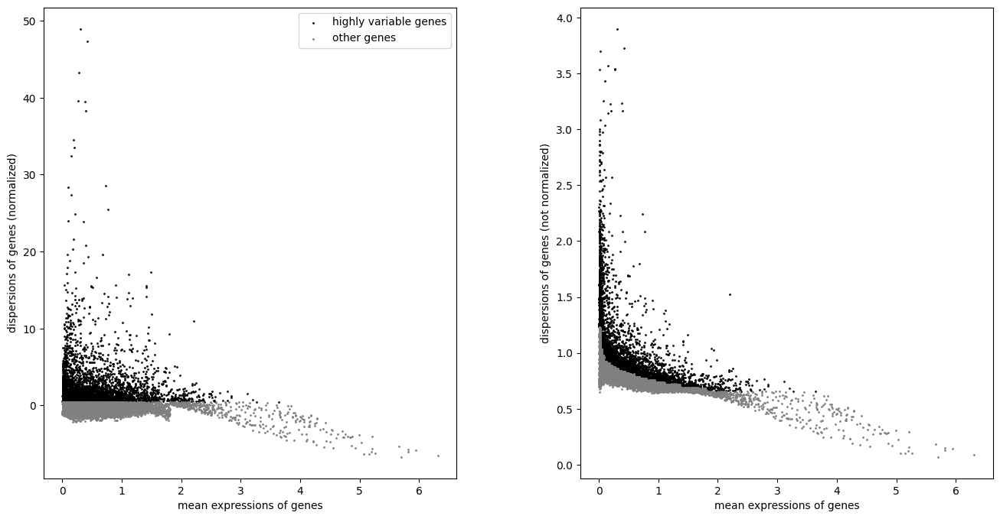

In [8]:
sc.pl.highly_variable_genes(adata1)

In [9]:
sc.pp.highly_variable_genes(adata2, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata2.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


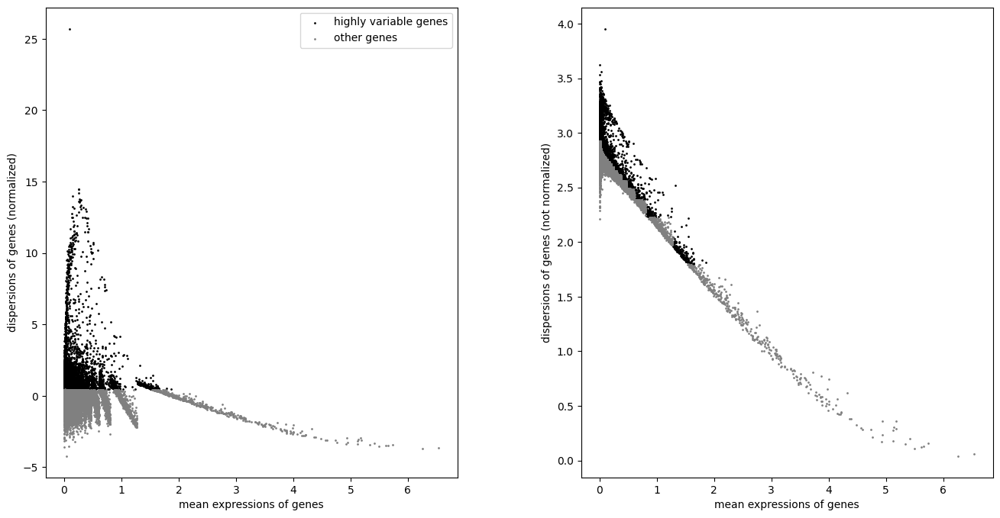

In [10]:
sc.pl.highly_variable_genes(adata2)

In [11]:
sc.pp.highly_variable_genes(adata3, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata3.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


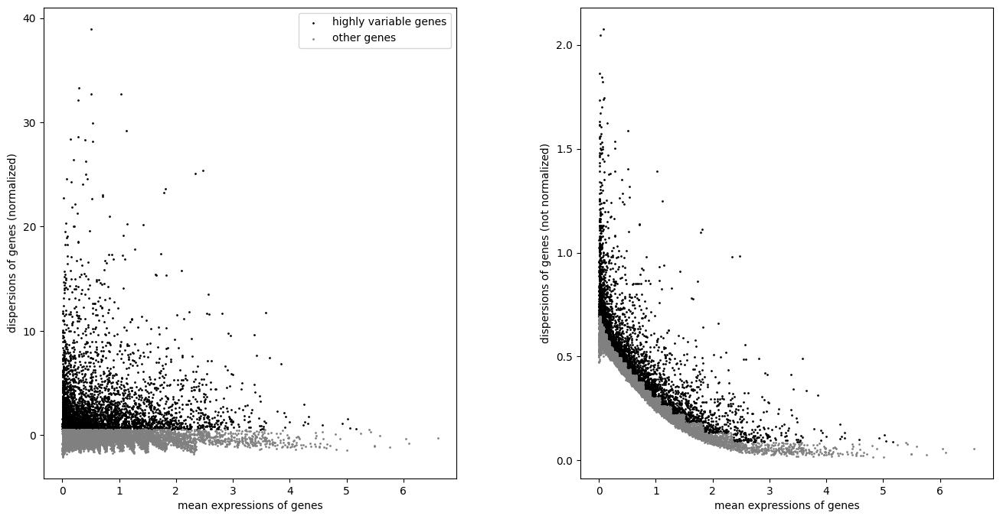

In [12]:
sc.pl.highly_variable_genes(adata3)

In [13]:
sc.pp.highly_variable_genes(adata4, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata4.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


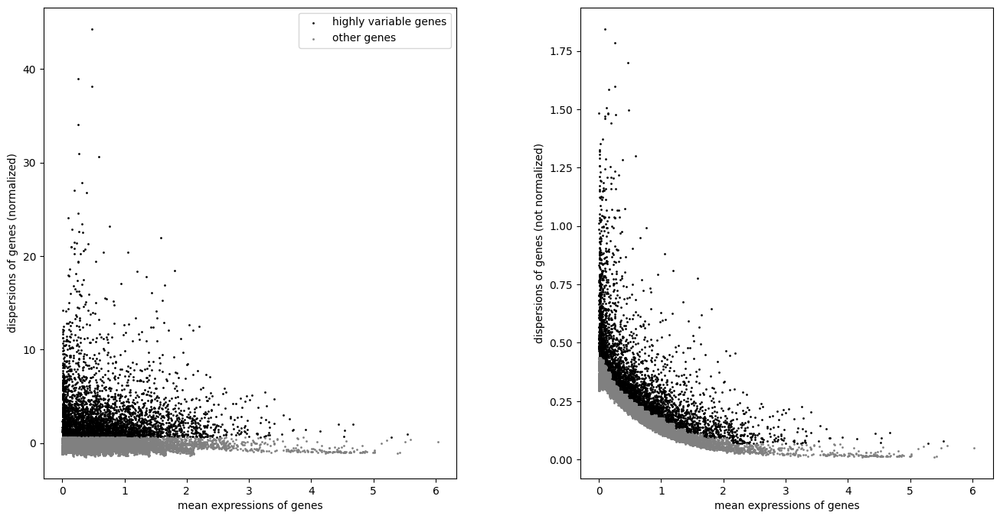

In [14]:
sc.pl.highly_variable_genes(adata4)

In [15]:
sc.pp.highly_variable_genes(adata5, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata4.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


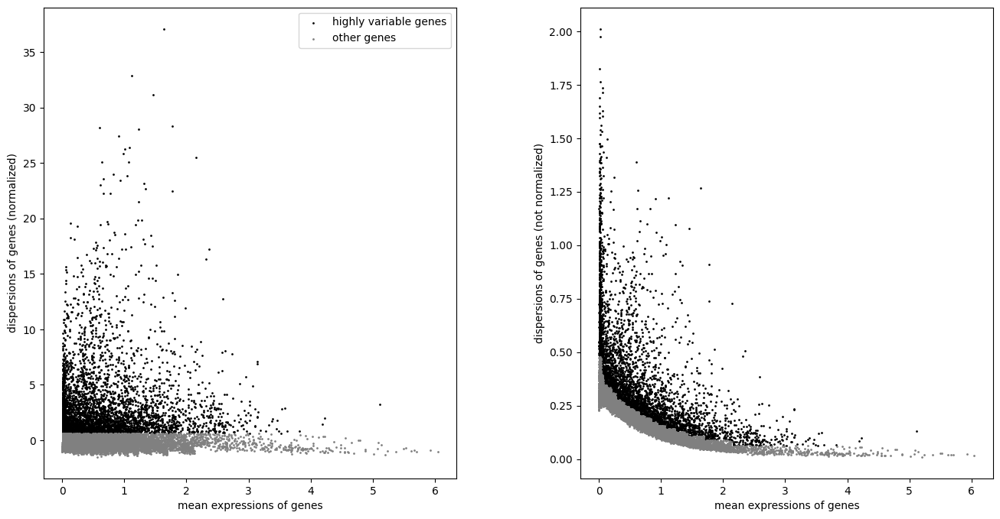

In [16]:
sc.pl.highly_variable_genes(adata5)

In [17]:
sc.pp.highly_variable_genes(adata6, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata4.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


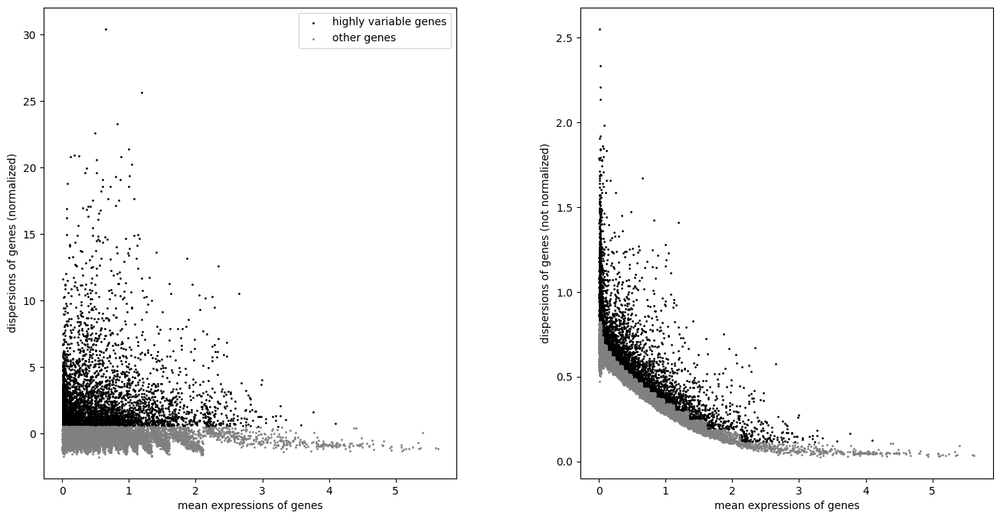

In [18]:
sc.pl.highly_variable_genes(adata6)

In [19]:
sc.pp.highly_variable_genes(adata7, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata4.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


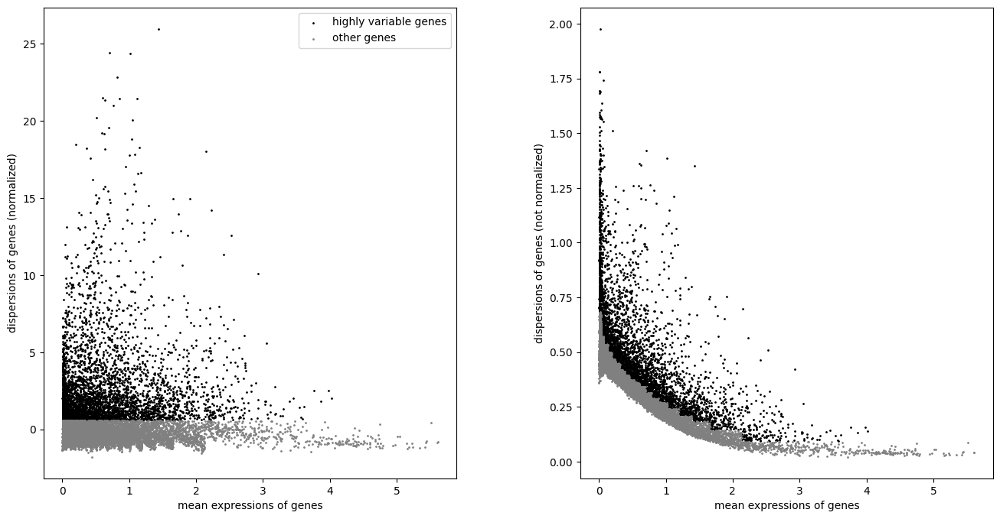

In [20]:
sc.pl.highly_variable_genes(adata7)

<a id="Visualization"></a>

## Visualization

### Sample 1 : 1_9591_TEBBO

In [21]:
# Calculate the visualizations
sc.pp.pca(adata1, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata1)

sc.tl.tsne(adata1, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata1)
sc.tl.diffmap(adata1)
sc.tl.draw_graph(adata1)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:21)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9978668  0.992054   0.9776943  0.9747718  0.95369697
     0.94434196 0.93974376 0.935672   0.9304369  0.9278413  0.92127055
     0.90912414 0.89796185 0.89210933]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata

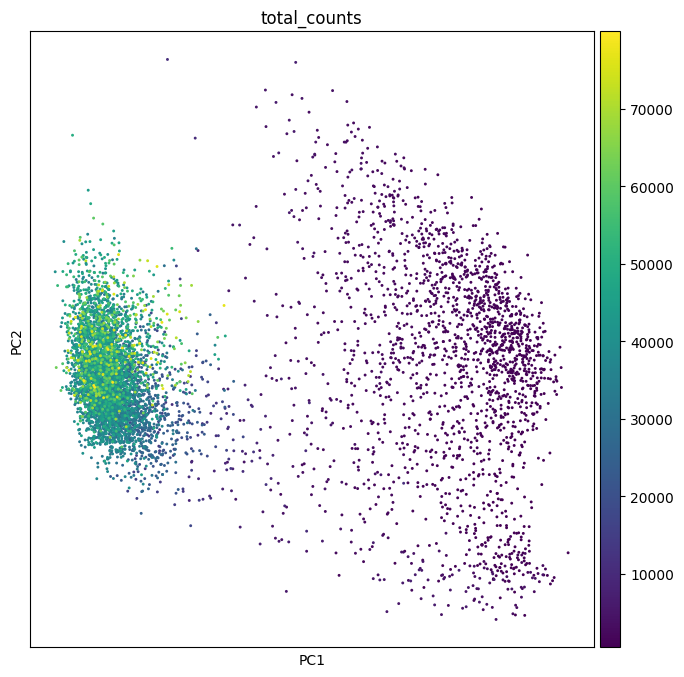

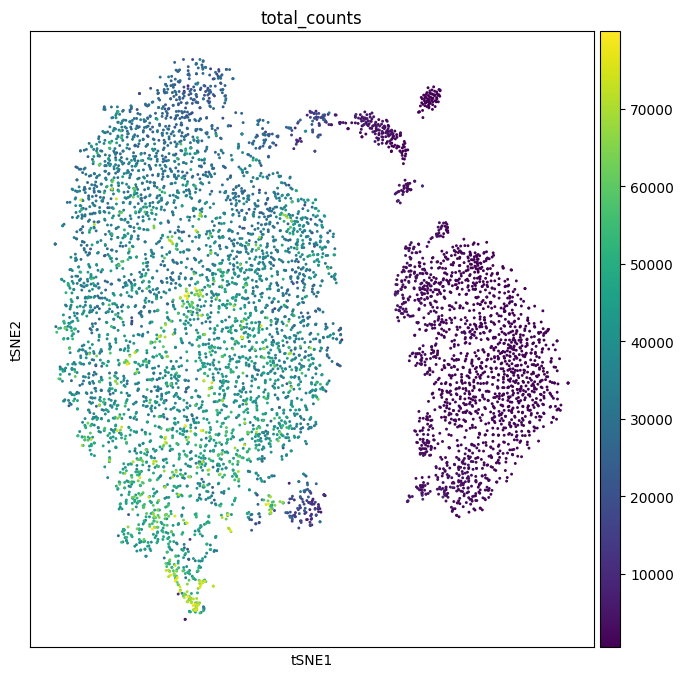

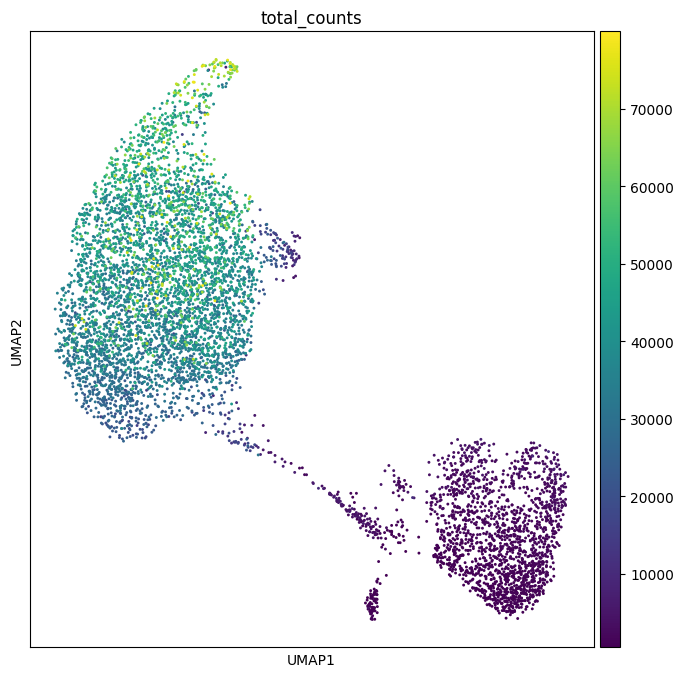

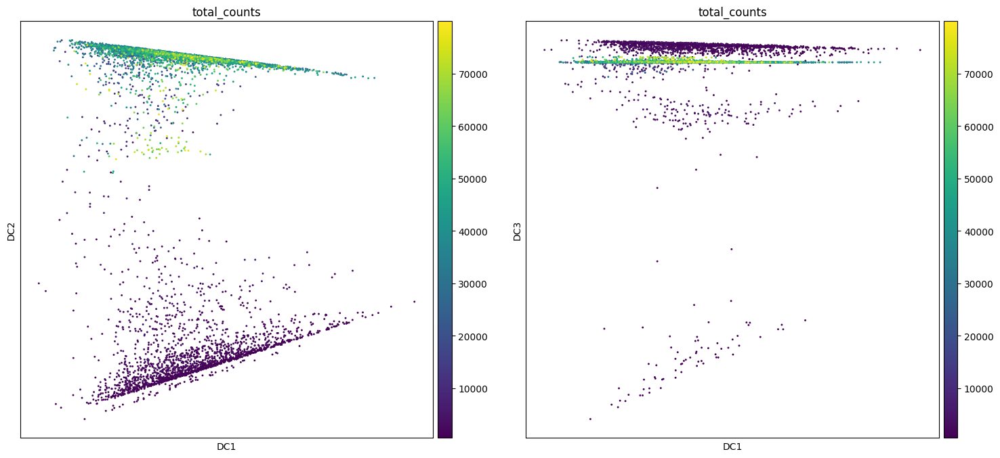

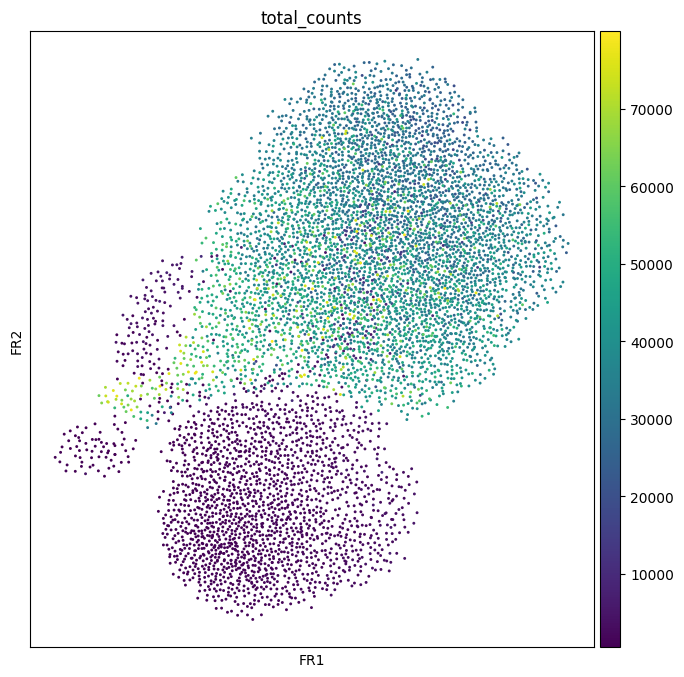

In [22]:
sc.pl.pca_scatter(adata1, color='total_counts', save='pca_1_9591_TEBBO.pdf')
sc.pl.tsne(adata1, color='total_counts', save='tsne_1_9591_TEBBO.pdf')
sc.pl.umap(adata1, color='total_counts', save='umap_1_9591_TEBBO.pdf')
sc.pl.diffmap(adata1, color='total_counts', components=['1,2','1,3'], save='diffmap_1_9591_TEBBO.pdf')
sc.pl.draw_graph(adata1, color='total_counts', save='draw_graph_1_9591_TEBBO.pdf')

In [23]:
# sc.pl.pca_scatter(adata1, color='total_counts')
# sc.pl.tsne(adata1, color='total_counts')
# sc.pl.umap(adata1, color='total_counts')
# sc.pl.diffmap(adata1, color='total_counts', components=['1,2','1,3'])
# sc.pl.draw_graph(adata1, color='total_counts')

### Sample 2: 2_9591_cystic_branched

In [24]:
# Calculate the visualizations
sc.pp.pca(adata2, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata2)

sc.tl.tsne(adata2, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata2)
sc.tl.diffmap(adata2)
sc.tl.draw_graph(adata2)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:27)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.97544914 0.97068864 0.94713473 0.9468701  0.9344495
     0.9304454  0.9257761  0.92416126 0.9210122  0.9179667  0.91559905
     0.90521747 0.9048201  0.90141076]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.

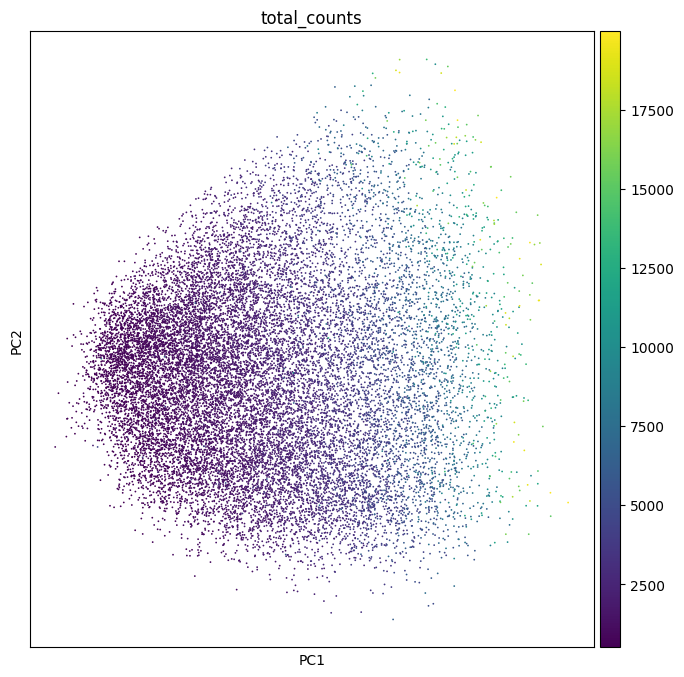

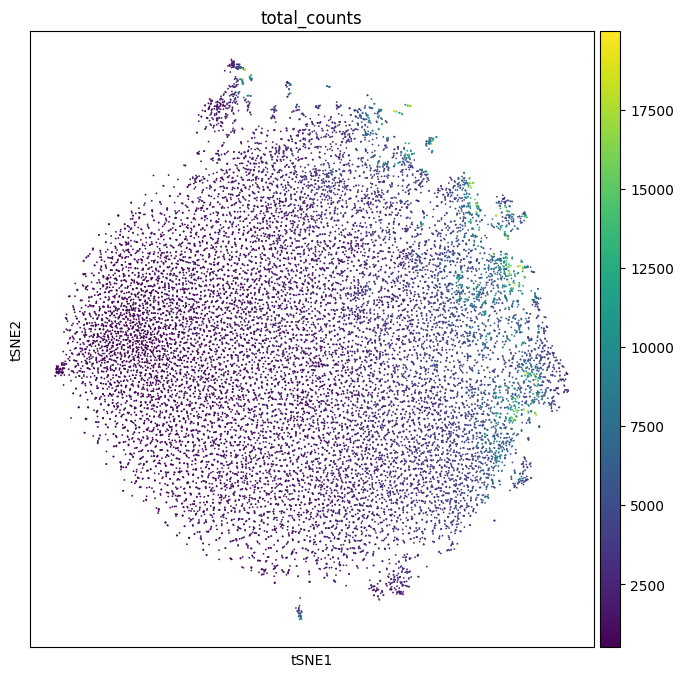

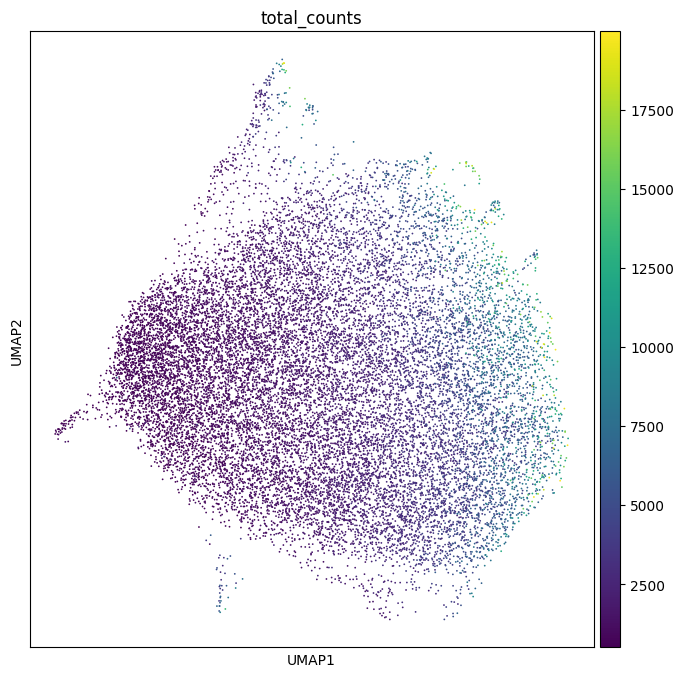

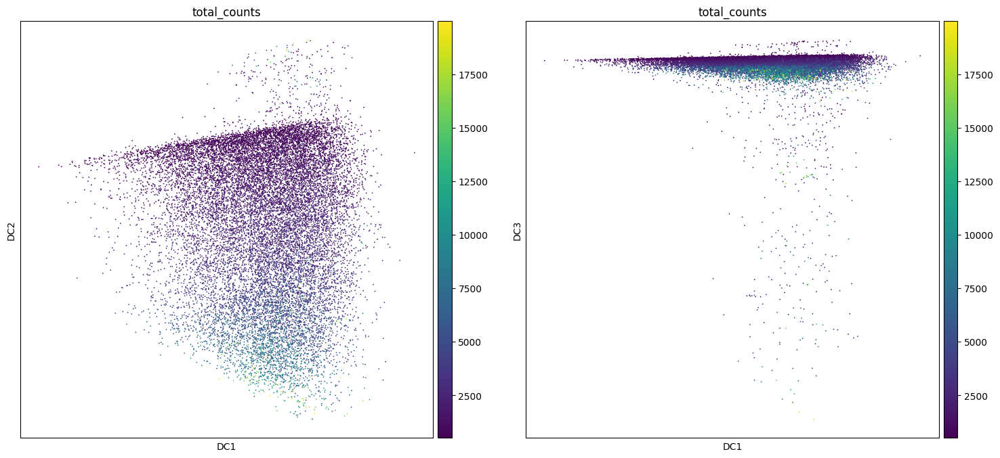

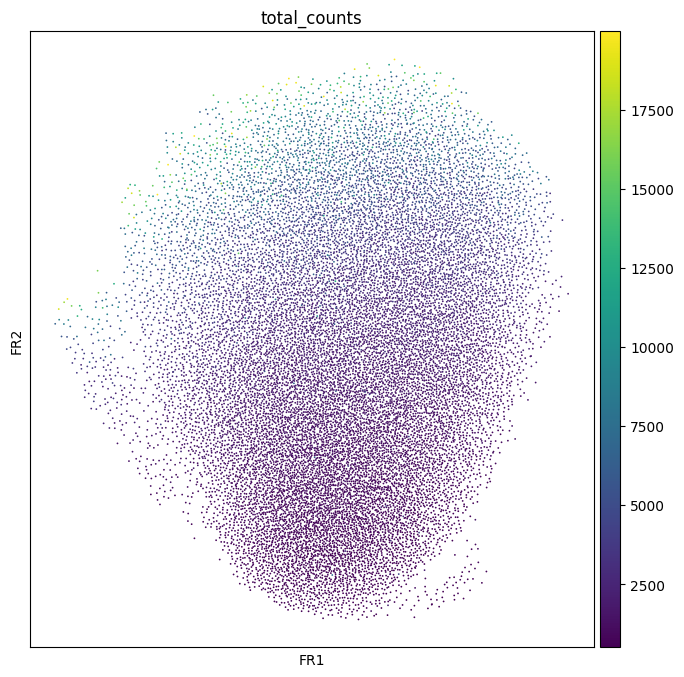

In [25]:
sc.pl.pca_scatter(adata2, color='total_counts', save='pca_2_9591_cystic_branched.pdf')
sc.pl.tsne(adata2, color='total_counts', save='tsne_2_9591_cystic_branched.pdf')
sc.pl.umap(adata2, color='total_counts', save='umap_2_9591_cystic_branched.pdf')
sc.pl.diffmap(adata2, color='total_counts', components=['1,2','1,3'], save='diffmap_2_9591_cystic_branched.pdf')
sc.pl.draw_graph(adata2, color='total_counts', save='draw_graph_2_9591_cystic_branched.pdf')

In [26]:
# sc.pl.pca_scatter(adata2, color='total_counts')
# sc.pl.tsne(adata2, color='total_counts')
# sc.pl.umap(adata2, color='total_counts')
# sc.pl.diffmap(adata2, color='total_counts', components=['1,2','1,3'])
# sc.pl.draw_graph(adata2, color='total_counts')

### Sample 3: 3_thick_branched

In [27]:
# Calculate the visualizations
sc.pp.pca(adata3, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata3)

sc.tl.tsne(adata3, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata3)
sc.tl.diffmap(adata3)
sc.tl.draw_graph(adata3)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98623914 0.9769835  0.9676957  0.9593762  0.93489295
     0.9228726  0.9198979  0.90948975 0.9064924  0.90206456 0.89697695
     0.89134586 0.88507193 0.87770474]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata

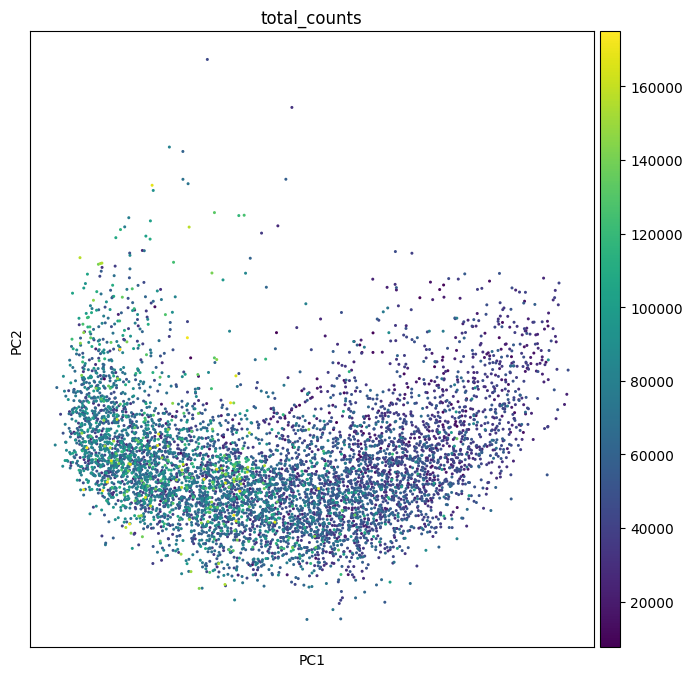

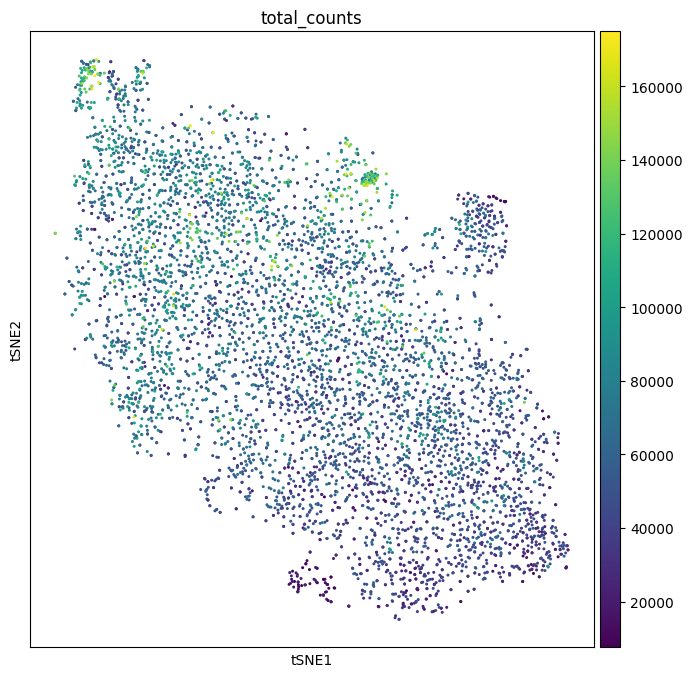

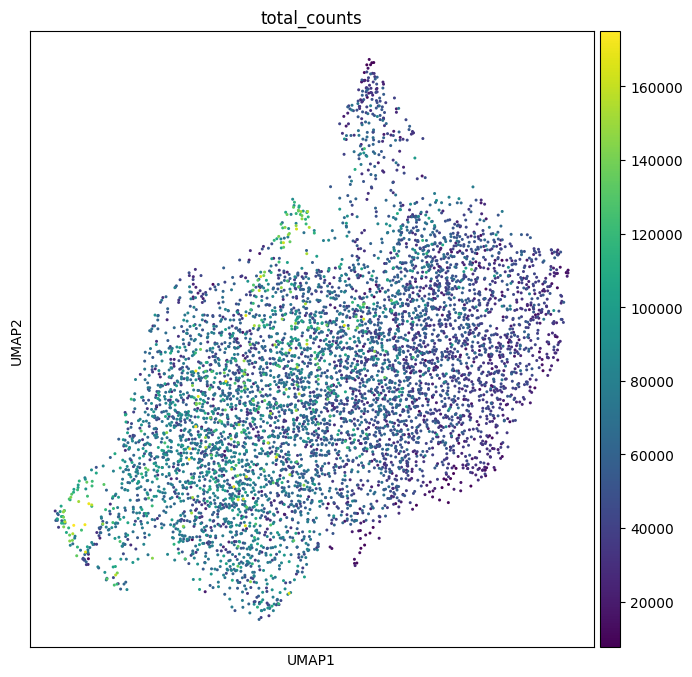

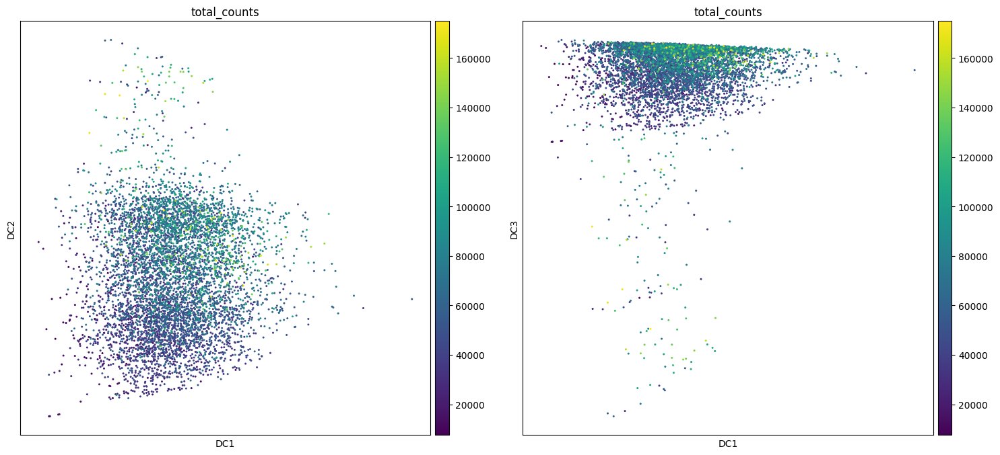

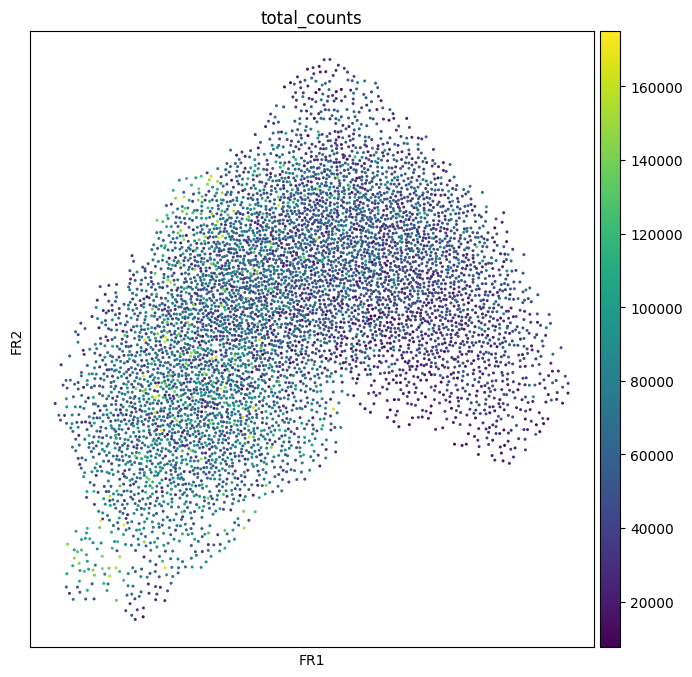

In [28]:
sc.pl.pca_scatter(adata3, color='total_counts', save='pca_3_thick_branched.pdf')
sc.pl.tsne(adata3, color='total_counts', save='tsne_3_thick_branched.pdf')
sc.pl.umap(adata3, color='total_counts', save='umap_3_thick_branched.pdf')
sc.pl.diffmap(adata3, color='total_counts', components=['1,2','1,3'], save='diffmap_3_thick_branched.pdf')
sc.pl.draw_graph(adata3, color='total_counts', save='draw_graph_3_thick_branched.pdf')

### Sample 4: 4_tree-like

In [29]:
# Calculate the visualizations
sc.pp.pca(adata4, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata4)

sc.tl.tsne(adata4, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata4)
sc.tl.diffmap(adata4)
sc.tl.draw_graph(adata4)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98136985 0.94365746 0.93373615 0.9231229  0.90800357
     0.904415   0.8913829  0.8832051  0.8675452  0.8598283  0.85744095
     0.8440767  0.8394511  0.8327987 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata

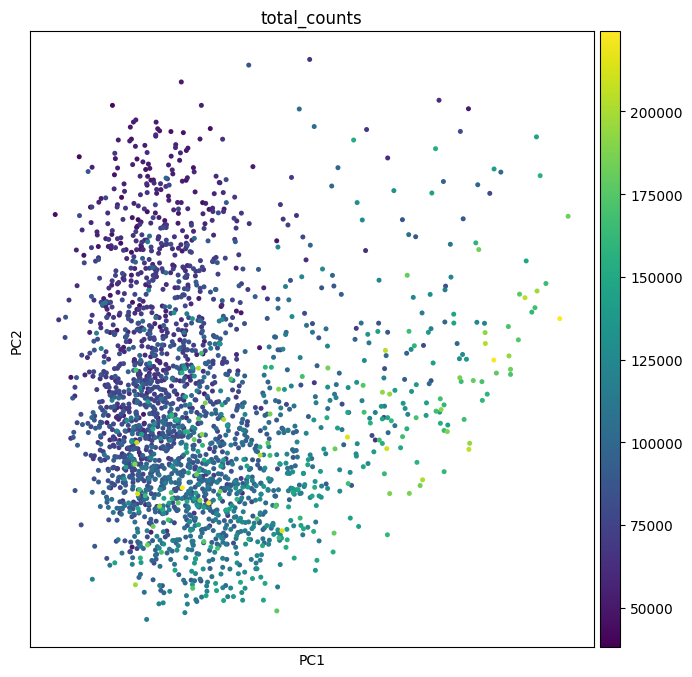

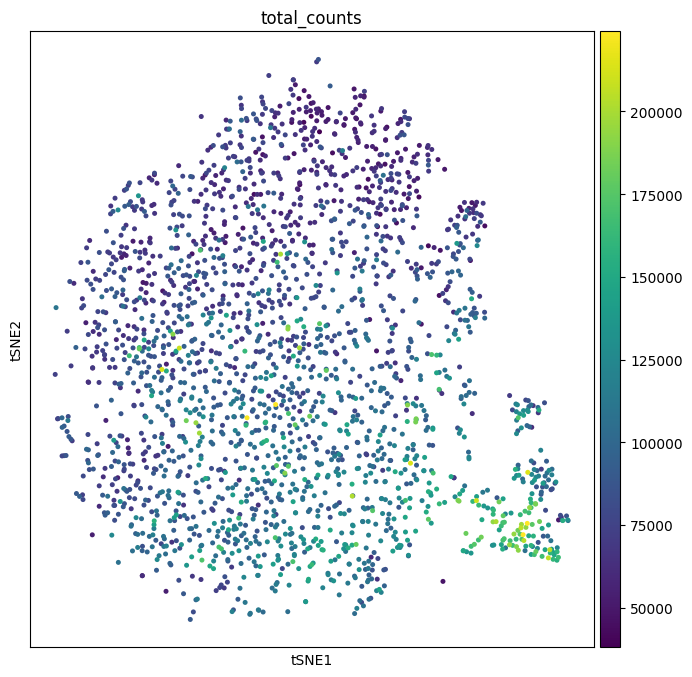

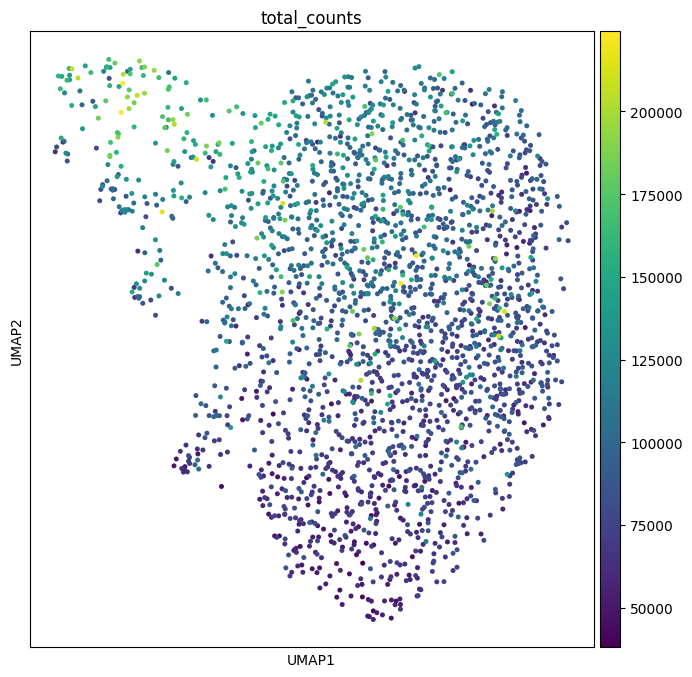

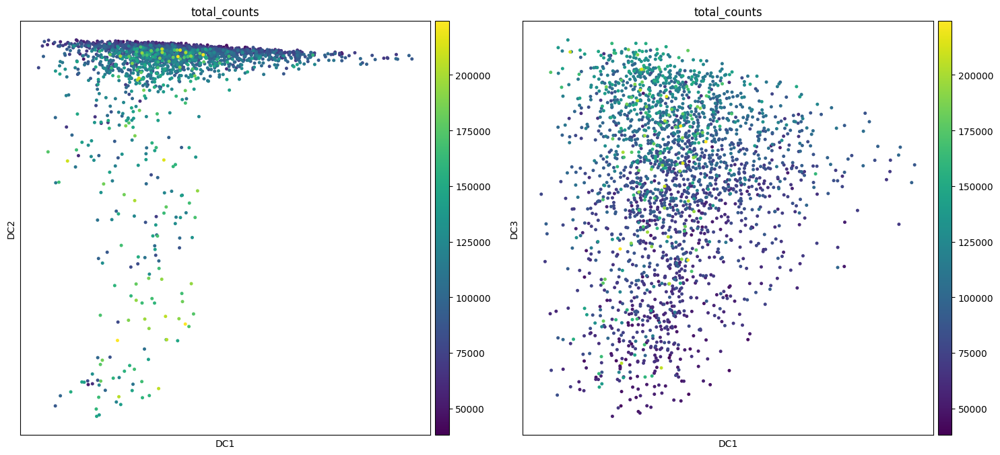

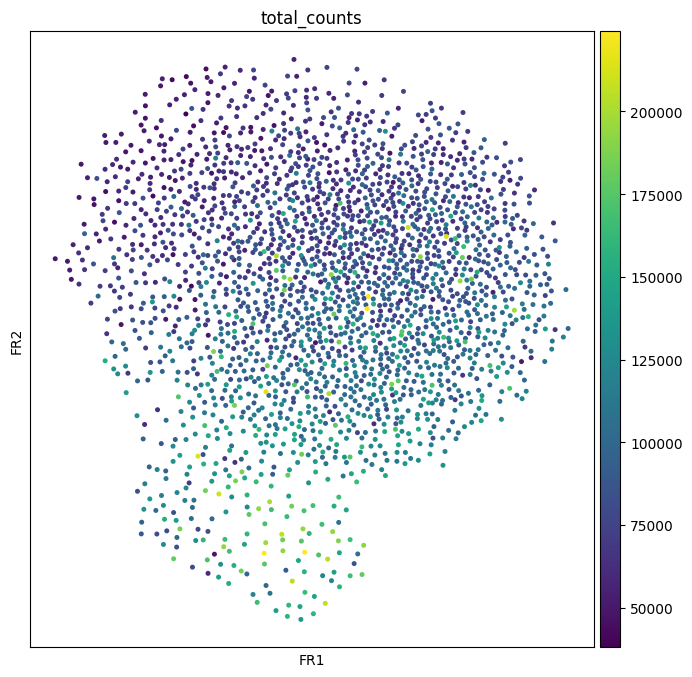

In [30]:
sc.pl.pca_scatter(adata4, color='total_counts', save='pca_4_tree-like.pdf')
sc.pl.tsne(adata4, color='total_counts', save='tsne_4_tree-like.pdf')
sc.pl.umap(adata4, color='total_counts', save='umap_4_tree-like.pdf')
sc.pl.diffmap(adata4, color='total_counts', components=['1,2','1,3'], save='diffmap_4_tree-like.pdf')
sc.pl.draw_graph(adata4, color='total_counts', save='draw_graph_4_tree-like.pdf')

In [31]:
# sc.pl.pca_scatter(adata4, color='total_counts')
# sc.pl.tsne(adata4, color='total_counts')
# sc.pl.umap(adata4, color='total_counts')
# sc.pl.diffmap(adata4, color='total_counts', components=['1,2','1,3'])
# sc.pl.draw_graph(adata4, color='total_counts')

### Sample 5: 5_branched_mesenchymal

In [32]:
# Calculate the visualizations
sc.pp.pca(adata5, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata5)

sc.tl.tsne(adata5, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata5)
sc.tl.diffmap(adata5)
sc.tl.draw_graph(adata5)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9897632  0.9750436  0.96472704 0.9360855  0.91955316
     0.9123344  0.9058479  0.8847207  0.8811663  0.8715031  0.86052483
     0.85149074 0.83613527 0.82806325]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata

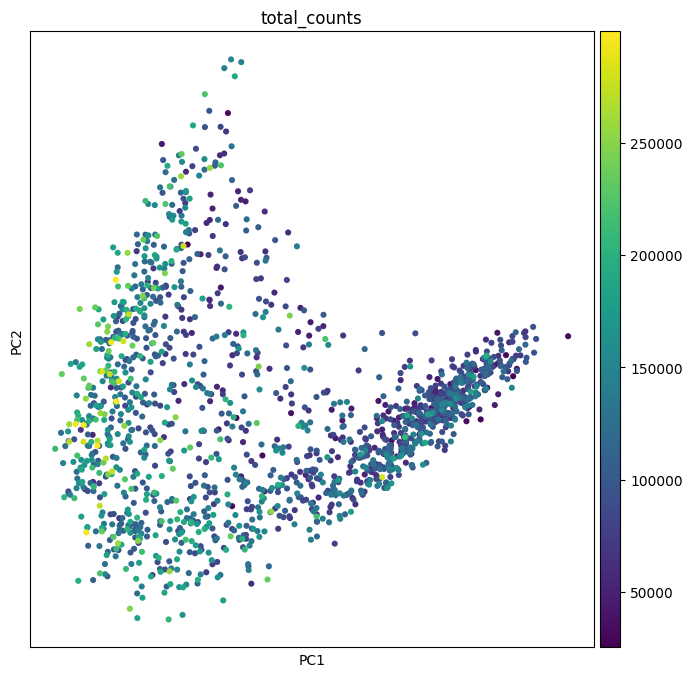

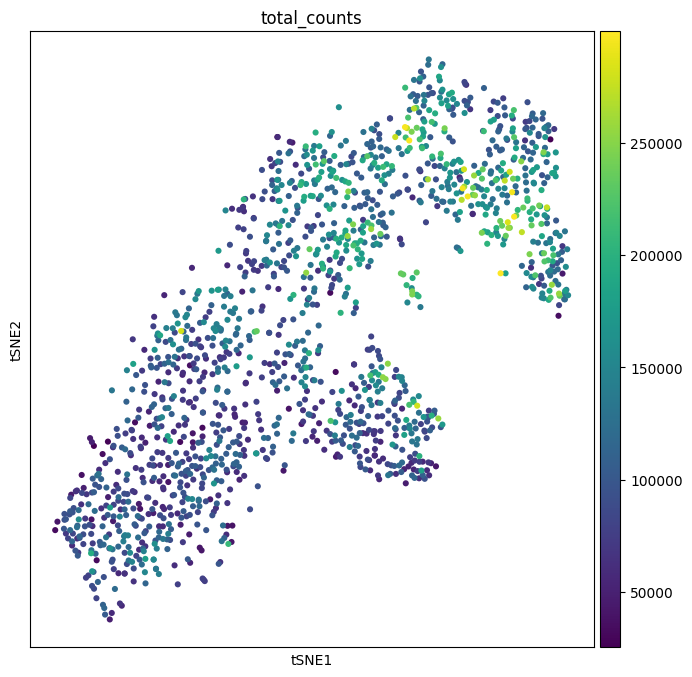

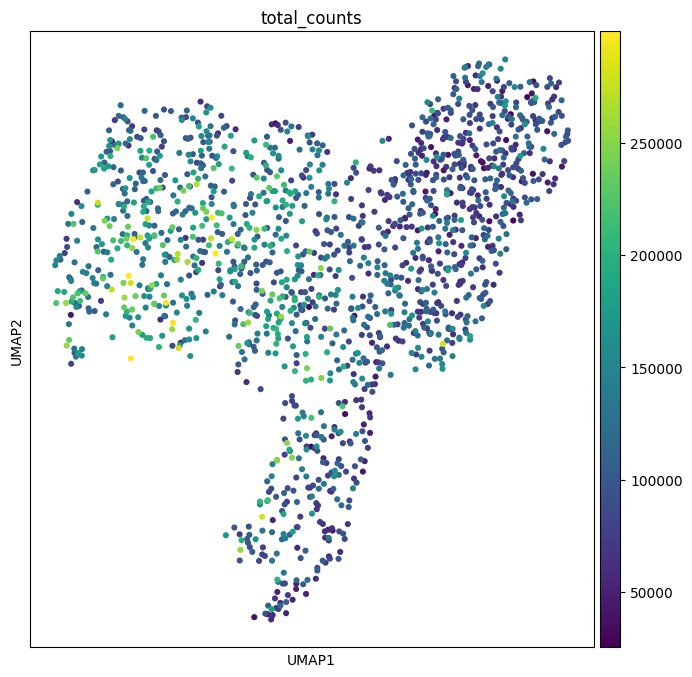

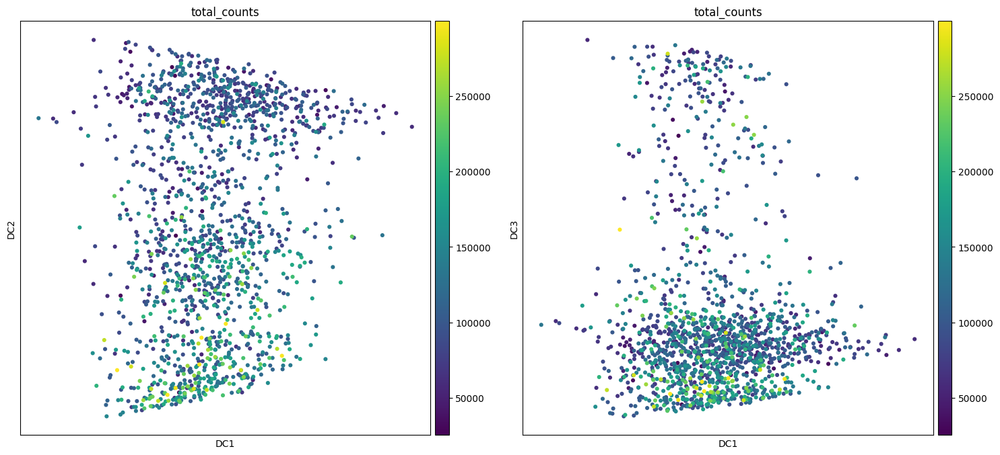

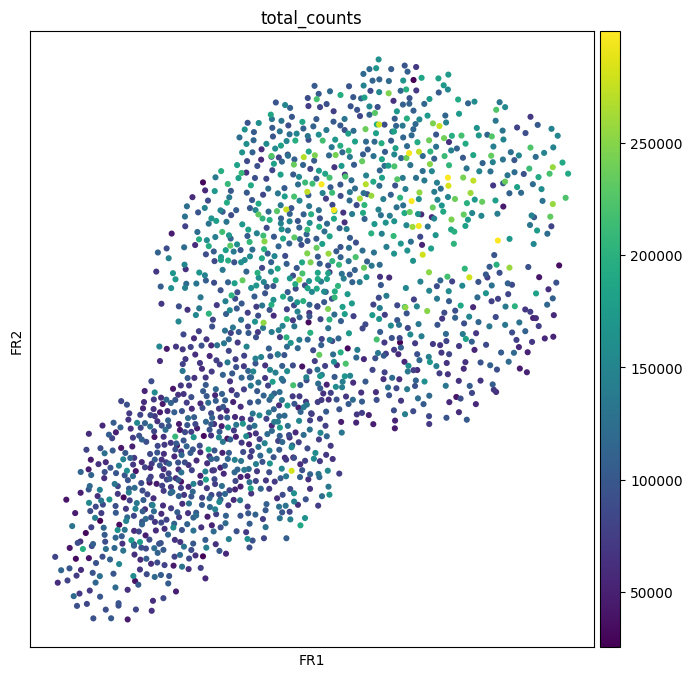

In [33]:
sc.pl.pca_scatter(adata5, color='total_counts', save='pca_5_branched_mesenchymal.pdf')
sc.pl.tsne(adata5, color='total_counts', save='tsne_5_branched_mesenchymal.pdf')
sc.pl.umap(adata5, color='total_counts', save='umap_5_branched_mesenchymal.pdf')
sc.pl.diffmap(adata5, color='total_counts', components=['1,2','1,3'], save='diffmap_5_branched_mesenchymal.pdf')
sc.pl.draw_graph(adata5, color='total_counts', save='draw_graph_5_branched_mesenchymal.pdf')

### Sample 6: 6_firework

In [34]:
# Calculate the visualizations
sc.pp.pca(adata6, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata6)

sc.tl.tsne(adata6, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata6)
sc.tl.diffmap(adata6)
sc.tl.draw_graph(adata6)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98975176 0.98264045 0.96909654 0.9677324  0.96316427
     0.95583534 0.95077884 0.94025254 0.92020446 0.9178988  0.9117823
     0.90823996 0.90177846 0.8951258 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.

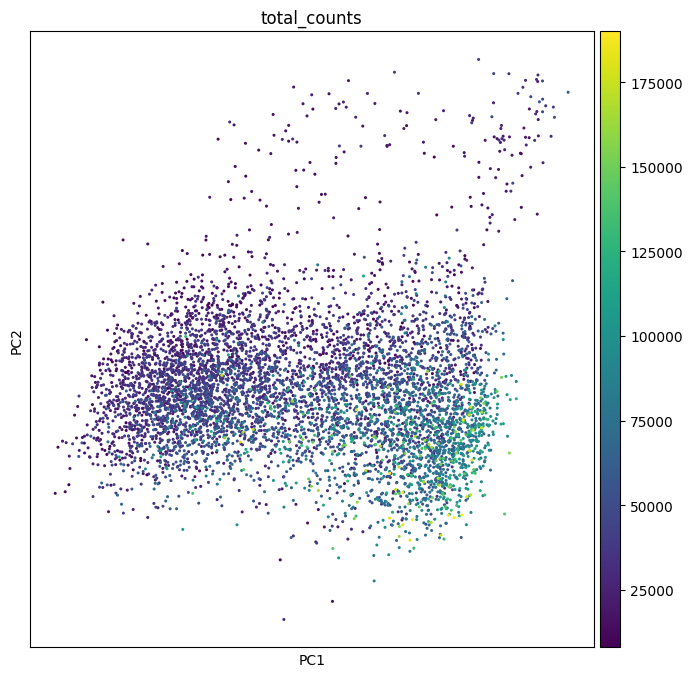

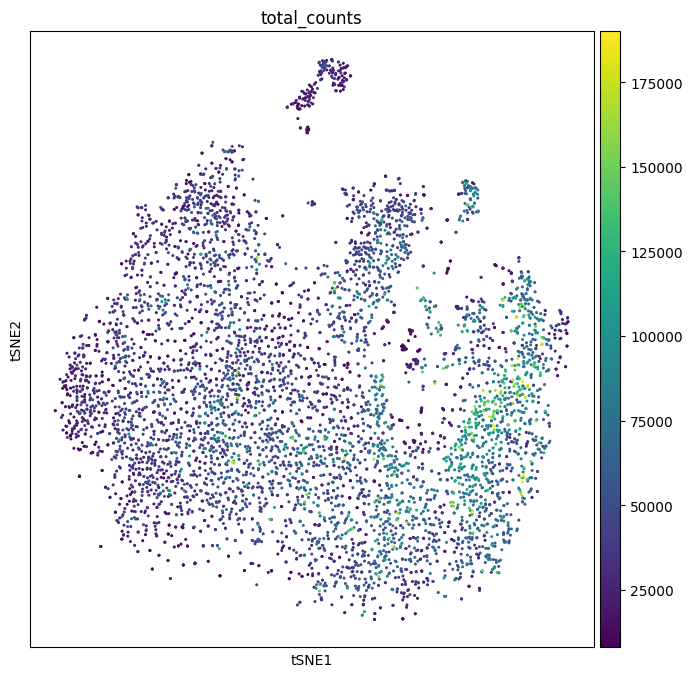

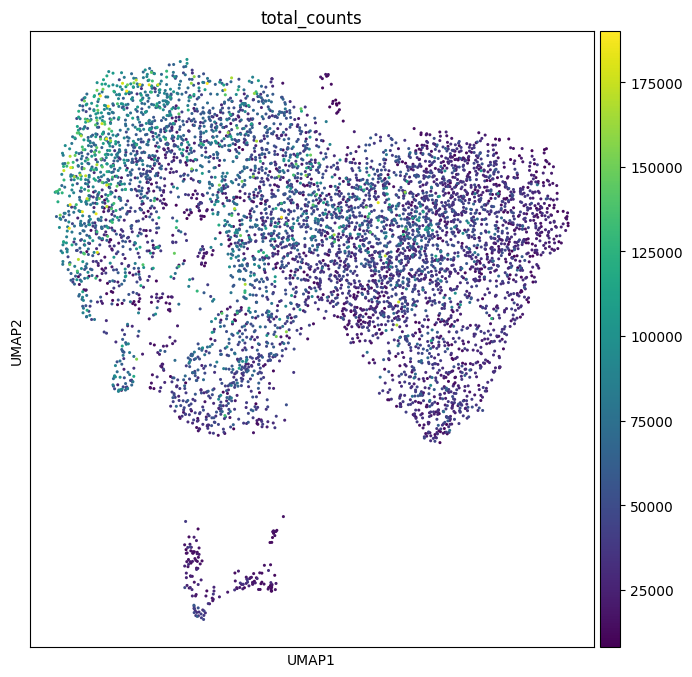

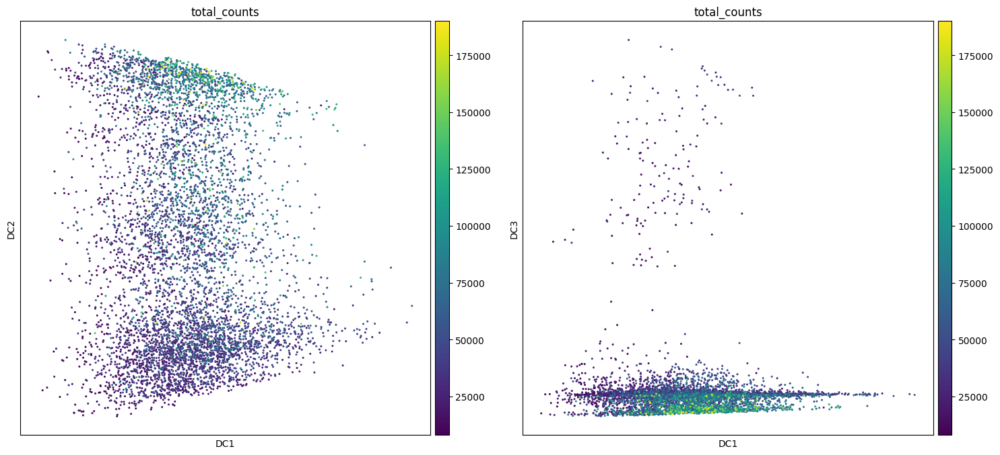

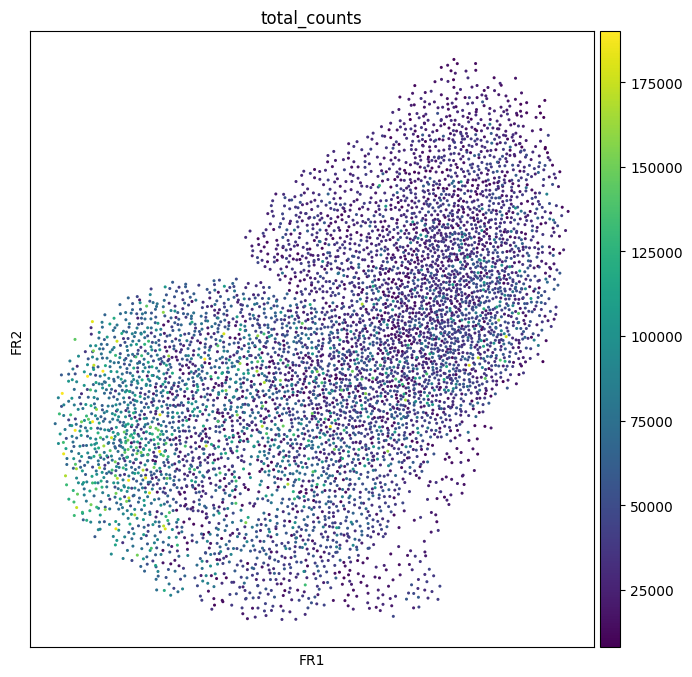

In [35]:
sc.pl.pca_scatter(adata6, color='total_counts', save='pca_6_firework.pdf')
sc.pl.tsne(adata6, color='total_counts', save='tsne_6_firework.pdf')
sc.pl.umap(adata6, color='total_counts', save='umap_6_firework.pdf')
sc.pl.diffmap(adata6, color='total_counts', components=['1,2','1,3'], save='diffmap_6_firework.pdf')
sc.pl.draw_graph(adata6, color='total_counts', save='draw_graph_6_firework.pdf')

### Sample 7: 7_star-like

In [36]:
# Calculate the visualizations
sc.pp.pca(adata7, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata7)

sc.tl.tsne(adata7, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata7)
sc.tl.diffmap(adata7)
sc.tl.draw_graph(adata7)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9896394  0.9795716  0.97255725 0.9668913  0.9577535
     0.95210147 0.93372625 0.9318526  0.92713755 0.92258036 0.9150001
     0.9055132  0.9000555  0.89810866]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.u

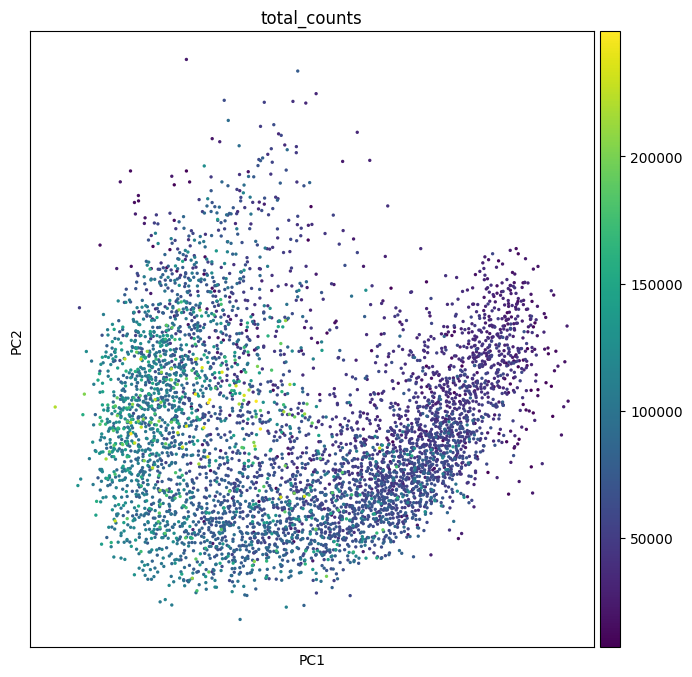

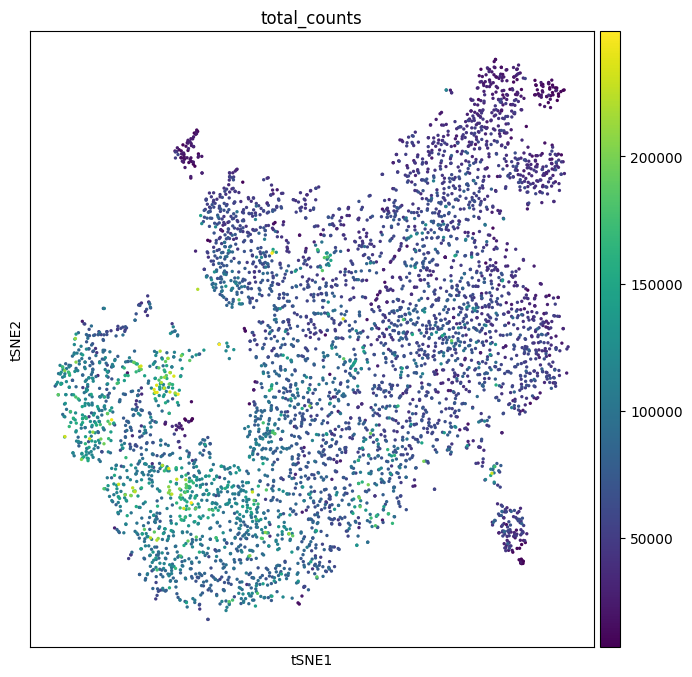

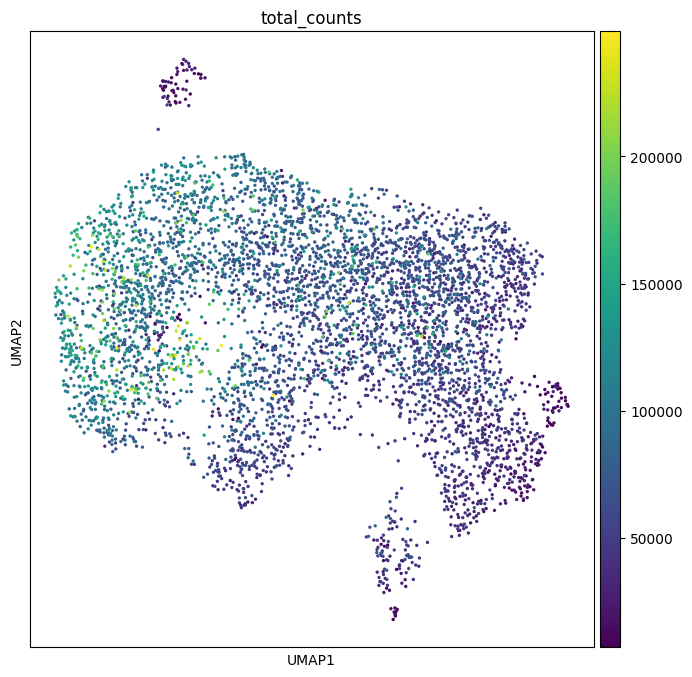

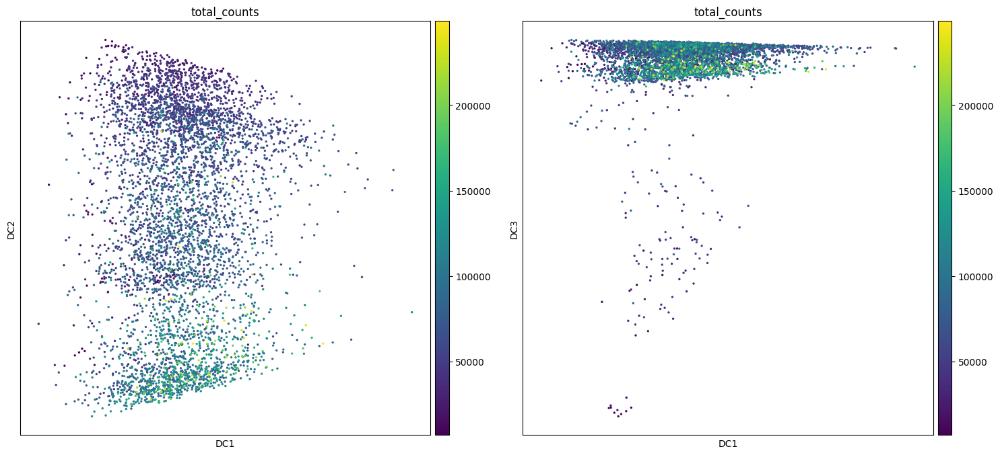

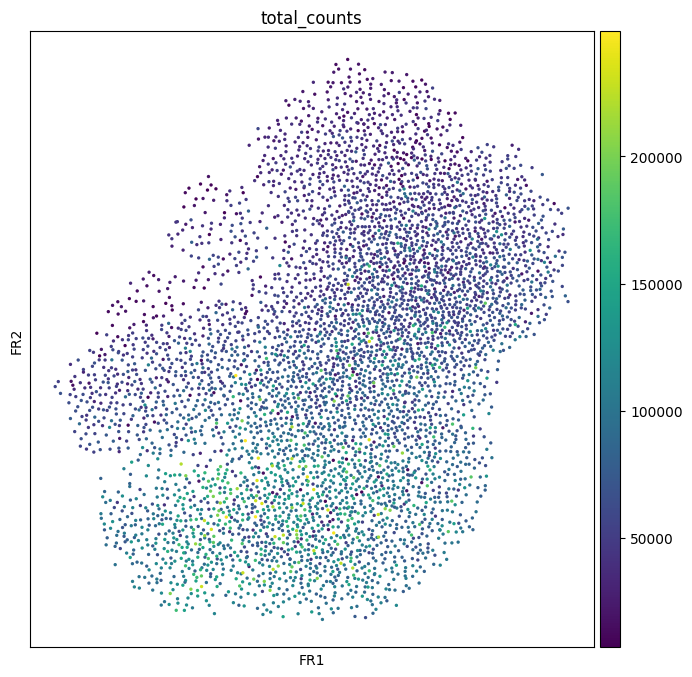

In [37]:
sc.pl.pca_scatter(adata7, color='total_counts', save='pca_7_star-like.pdf')
sc.pl.tsne(adata7, color='total_counts', save='tsne_7_star-like.pdf')
sc.pl.umap(adata7, color='total_counts', save='umap_7_star-like.pdf')
sc.pl.diffmap(adata7, color='total_counts', components=['1,2','1,3'], save='diffmap_7_star-like.pdf')
sc.pl.draw_graph(adata7, color='total_counts', save='draw_graph_7_star-like.pdf')

# Save processed adatas

<a id="CC"></a>

In [38]:
adata1.write_h5ad('../data/adata/rev_processed_adata1.h5ad')
adata2.write_h5ad('../data/adata/rev_processed_adata2.h5ad')
adata3.write_h5ad('../data/adata/rev_processed_adata3.h5ad')
adata4.write_h5ad('../data/adata/rev_processed_adata4.h5ad')
adata5.write_h5ad('../data/adata/rev_processed_adata5.h5ad')
adata6.write_h5ad('../data/adata/rev_processed_adata6.h5ad')
adata7.write_h5ad('../data/adata/rev_processed_adata7.h5ad')